<a href="https://colab.research.google.com/github/bitunsen/datascience/blob/master/cassava_leaf_disease_classification_using_inceptionv3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle

     |████████████████████████████████| 61kB 3.1MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.10-cp36-none-any.whl size=73269 sha256=67f9cccc5365f3f577b29985305b2001b7983bd65c134a56a0cbc2fcca980fa9
  Stored in directory: /root/.cache/pip/wheels/3a/d1/7e/6ce09b72b770149802c653a02783821629146983ee5a360f10
Successfully built kaggle
  Found existing installation: kaggle 1.5.9
    Uninstalling kaggle-1.5.9:
      Successfully uninstalled kaggle-1.5.9


In [ ]:
!mkdir /root/.kaggle
!pwd

/content


Setup Kaggle credential to get access to the kaggle account to download the competition datasets

In [ ]:
!touch ~/.kaggle/kaggle.json

api_token = {"username":"bitunsen","key":"c6e2314c8361a066bfadb1be893f69cb"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!ls -lrt ~/.kaggle/kaggle.json

-rw------- 1 root root 67 Dec  7 14:11 /root/.kaggle/kaggle.json


In [ ]:
import kaggle

In [ ]:
!mkdir cassava-leaf-disease-classification

In [ ]:
!kaggle competitions download -c cassava-leaf-disease-classification

100% 5.75G/5.76G [02:57<00:00, 65.5MB/s]
100% 5.76G/5.76G [02:57<00:00, 34.8MB/s]


In [ ]:
!ls -lrt

total 6040700
drwxr-xr-x 1 root root       4096 Dec  2 22:04 sample_data
drwxr-xr-x 2 root root       4096 Dec  7 14:11 cassava-leaf-disease-classification
-rw-r--r-- 1 root root 6185662420 Dec  7 14:15 cassava-leaf-disease-classification.zip


In [ ]:
from zipfile import ZipFile
with ZipFile('/content/cassava-leaf-disease-classification.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall('/content/cassava-leaf-disease-classification/')

In [ ]:
!ls -lrt cassava-leaf-disease-classification/

total 1088
-rw-r--r-- 1 root root    172 Dec  7 14:15 label_num_to_disease_map.json
drwxr-xr-x 2 root root   4096 Dec  7 14:15 test_tfrecords
drwxr-xr-x 2 root root   4096 Dec  7 14:15 test_images
-rw-r--r-- 1 root root     32 Dec  7 14:15 sample_submission.csv
-rw-r--r-- 1 root root 358283 Dec  7 14:15 train.csv
drwxr-xr-x 2 root root 729088 Dec  7 14:15 train_images
drwxr-xr-x 2 root root   4096 Dec  7 14:16 train_tfrecords


In [ ]:
RUNTIME = "COLLAB"

In [ ]:
BASE_DIR = "/kaggle/input/cassava-leaf-disease-classification/"
TRAIN_DIR = "/kaggle/input/cassava-leaf-disease-classification/train_images/"
TEST_DIR = "/kaggle/input/cassava-leaf-disease-classification/test_images/"

if RUNTIME == "COLLAB":
  BASE_DIR = "/content/cassava-leaf-disease-classification/"
  TRAIN_DIR = "/content/cassava-leaf-disease-classification/train_images/"
  TEST_DIR = "/content/cassava-leaf-disease-classification/test_images/"

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
import json
import cv2
from PIL import Image

In [ ]:
with open(os.path.join(BASE_DIR, "label_num_to_disease_map.json")) as file:
    map_classes = json.loads(file.read())
    
print(json.dumps(map_classes, indent=2))

{
  "0": "Cassava Bacterial Blight (CBB)",
  "1": "Cassava Brown Streak Disease (CBSD)",
  "2": "Cassava Green Mottle (CGM)",
  "3": "Cassava Mosaic Disease (CMD)",
  "4": "Healthy"
}


In [ ]:
label_list = [int(key) for key in map_classes.keys()]
label_list

[0, 1, 2, 3, 4]

In [ ]:
input_files = os.listdir(os.path.join(BASE_DIR, "train_images"))
print(f"Number of train images: {len(input_files)}")

Number of train images: 21397


In [ ]:
data_df = pd.read_csv(os.path.join(BASE_DIR, "train.csv"))
data_df.head(5)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [ ]:
data_df.shape

(21397, 2)

In [ ]:
data_df["class_name"] = data_df["label"].astype(str).map(map_classes)
data_df["label_str"] = data_df["label"].astype(str)
data_df.head(5)

,image_id,label,class_name,label_str
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB),0
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD),3
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD),1
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD),1
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD),3


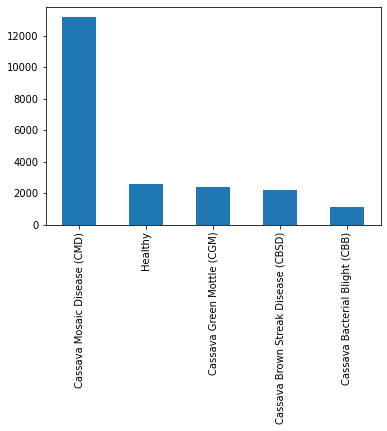

In [ ]:
data_df['class_name'].value_counts().plot(kind='bar')

Data is very imbalanced. So let us create a weight dictionary for the classes. This weight dictionary will be used while doing the training of the Keras model.

In [ ]:
from sklearn.utils import compute_class_weight
class_weight_array = compute_class_weight('balanced', label_list, data_df['label'])
class_weight_dict = dict()
for label, weight in zip(label_list, class_weight_array):
  class_weight_dict[label] = weight
class_weight_dict

{0: 3.9368905243790246,
 1: 1.954956601187757,
 2: 1.7935456831517183,
 3: 0.3252317981456148,
 4: 1.6606131160263873}

In [ ]:
def viewImage(_image_path, _image_id):
    figure = plt.figure(figsize=(16, 8))
    _image_path = os.path.join(_image_path, image_id)
    img_data = Image.open(_image_path)
    plt.axis('off')
    plt.imshow(img_data)

In [ ]:
def display_images_by_class(_class_name, _image_list):
    figure = plt.figure(figsize=(24, 24))
    i = 0
    for image_id in _image_list:
        _image_path = os.path.join(BASE_DIR, "train_images")
        _image_path = os.path.join(_image_path, image_id)
        img_data = Image.open(_image_path)
        plt.subplot(4, 4, i+1)
        plt.axis('off')
        plt.imshow(img_data, cmap='gray_r')
        plt.title(_class_name)
        i += 1

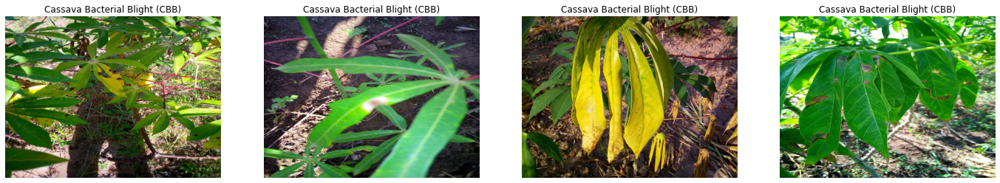

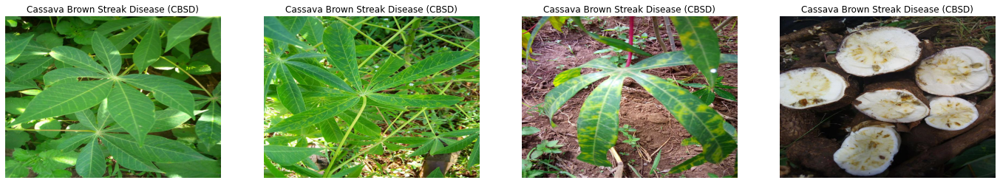

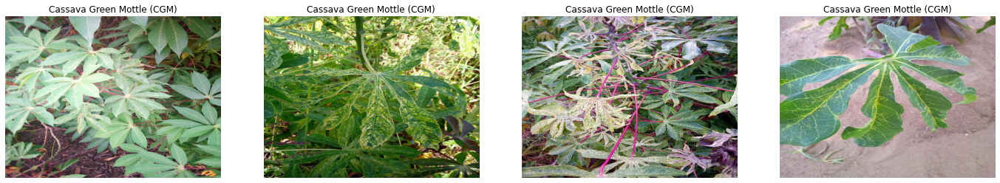

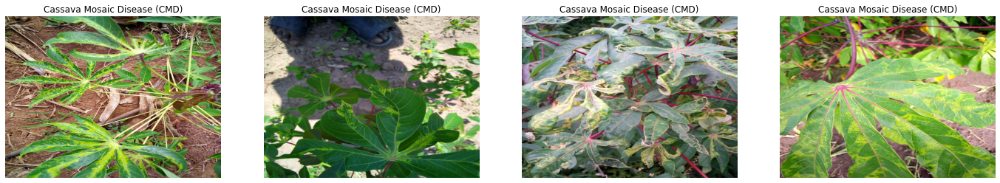

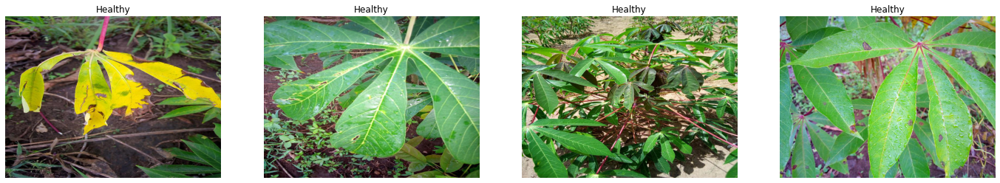

In [ ]:
sample_image_dict = {}
for class_label in map_classes:
    #print(map_classes[class_label])
    _temp_image_list = data_df[data_df['label'] == int(class_label)].head(4)['image_id'].tolist()
    #print(_temp_image_list)
    sample_image_dict[map_classes[class_label]] = _temp_image_list
    display_images_by_class(map_classes[class_label], _temp_image_list)

In [ ]:
IMG_HEIGHT = 400
IMG_WIDTH = 400
batch_size = 128

In [ ]:
from albumentations import (
    Compose, HorizontalFlip, Flip, CLAHE, HueSaturationValue, CenterCrop,
    RandomBrightness, RandomContrast, RandomGamma,Cutout,
    ToFloat, ShiftScaleRotate
)

In [ ]:
AUGMENTATIONS_TRAIN = Compose([
    HorizontalFlip(p=0.5),
    Flip(always_apply=False, p=1.0),
    RandomContrast(limit=0.2, p=0.5),
    #RandomGamma(gamma_limit=(80, 120), p=0.5),
    RandomBrightness(limit=0.2, p=0.5),
    #HueSaturationValue(hue_shift_limit=5, sat_shift_limit=20, val_shift_limit=10, p=.9),
    #Cutout(always_apply=False, p=1.0, num_holes=28, max_h_size=8, max_w_size=8),
    CenterCrop(always_apply=False, p=1.0, height=IMG_HEIGHT, width=IMG_WIDTH),
    ShiftScaleRotate(always_apply=False, 
                     p=0.5, shift_limit=0, 
                     scale_limit=(0.5, 1.50), 
                     rotate_limit=15, 
                     interpolation=0, border_mode=0),
    #ShiftScaleRotate(
    #    shift_limit=0.0625, scale_limit=0.1, 
    #    rotate_limit=15, border_mode=cv2.BORDER_REFLECT_101, p=0.8), 
    ToFloat(max_value=255)
])

AUGMENTATIONS_TEST = Compose([
    ToFloat(max_value=255)
])

In [ ]:
def display_augmented_images_by_class(_class_name, _image_list):
    
    i = 0
    for image_id in _image_list:
        figure = plt.figure(figsize=(24, 16))
        _image_path = os.path.join(BASE_DIR, "train_images")
        _image_path = os.path.join(_image_path, image_id)
        img_data = Image.open(_image_path)
        plt.subplot(4, 4, 1)
        plt.axis('off')
        plt.imshow(img_data, cmap='gray_r')
        plt.title("ORG :: " + _class_name)
        img_data = np.array(img_data.resize((IMG_HEIGHT, IMG_WIDTH), Image.ANTIALIAS))
        for img_count in range(2, 5):
            aug_img_data = AUGMENTATIONS_TRAIN(image=img_data)["image"]
            plt.subplot(4, 4, img_count)
            plt.axis('off')
            plt.imshow(aug_img_data, cmap='gray_r')
            plt.title("AUG :: " + _class_name)


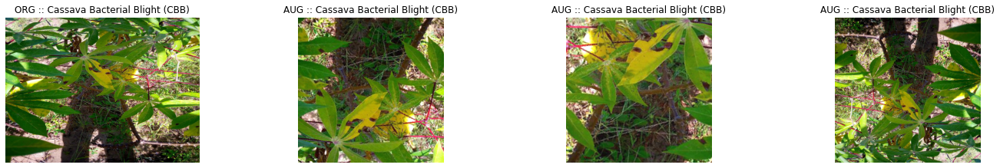

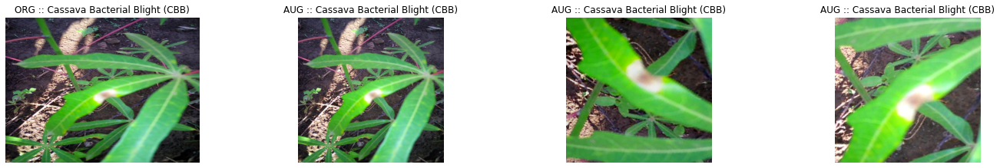

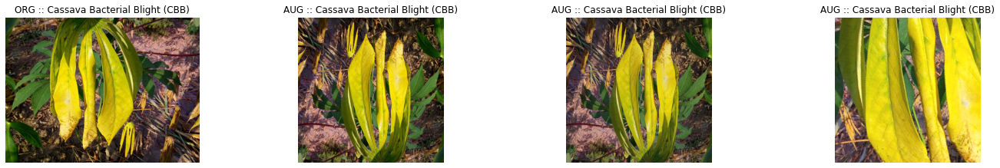

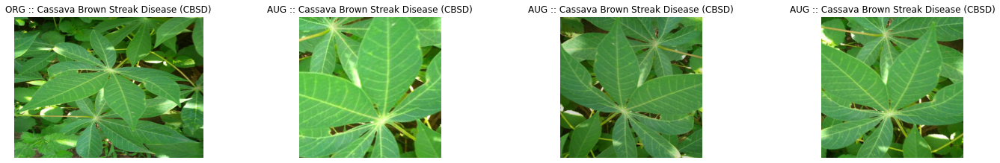

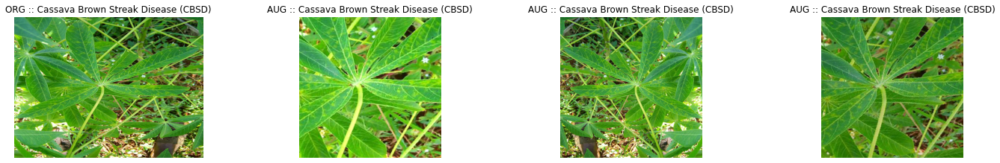

...

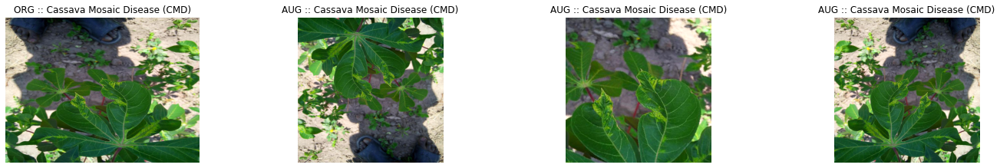

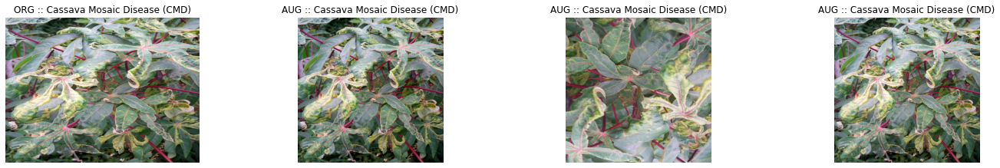

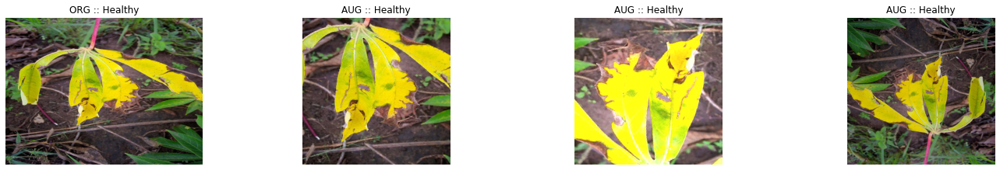

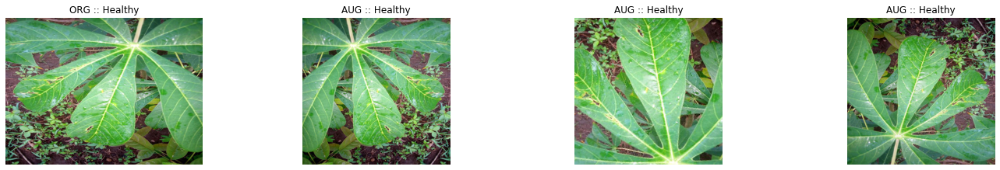

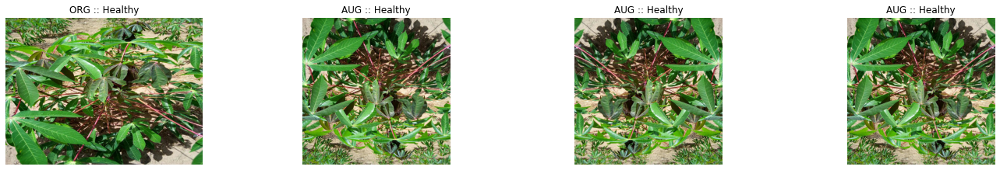

In [ ]:
for class_label in map_classes:
    _temp_image_list = data_df[data_df['label'] == int(class_label)].head(3)['image_id'].tolist()
    display_augmented_images_by_class(map_classes[class_label], _temp_image_list)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_images, validate_images, train_labels, validate_labels = train_test_split(data_df['image_id'], data_df['label'], test_size=0.20, random_state=42, stratify=data_df['label'])
print("Size of Training Set : ", train_images.shape)
print("Size of Training Label : ", train_labels.shape)
print("Size of Validation Set : ", validate_images.shape)
print("Size of Validation Label : ", validate_labels.shape)

Size of Training Set :  (17117,)
Size of Training Label :  (17117,)
Size of Validation Set :  (4280,)
Size of Validation Label :  (4280,)


In [ ]:

train_data_size = train_images.shape[0]
validate_data_size = validate_images.shape[0]

In [ ]:
IMG_HEIGHT = 400
IMG_WIDTH = 400
batch_size = 64

In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow.python.keras.utils.data_utils import Sequence
import random

def load_single_image(data_type, image_id):
        if data_type == "TEST_DATA":
            image_path = os.path.join(TEST_DIR, image_id)
        else:
            image_path = os.path.join(TRAIN_DIR, image_id)
        img_data = Image.open(image_path)
        img_data = np.array(img_data.resize((IMG_HEIGHT, IMG_WIDTH), Image.ANTIALIAS))
        #print(img_data)
        return img_data
    
    
class AugmentedImageSequence(Sequence):
    def __init__(self, mode, data_set_type, x_set, y_set, batch_size, augmentations):
        self.mode = mode
        self.data_type = data_set_type
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size
        self.augment = augmentations

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    
    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        
        if self.mode == "TEST":
            batch_y = []
        else:
            batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        
        #print("length of Batch_X : {}".format(len(batch_x)))
        img_list = []
        for x in batch_x:
            if self.data_type == "TRAIN_DATA":
                random_num = random.uniform(0, 1)
                if random_num > 0.5:
                    img_data = self.augment(image=load_single_image(self.data_type, x))["image"]
                else:
                    img_data = load_single_image(self.data_type, x)
            else:
                img_data = load_single_image(self.data_type, x)
            
            img_list.append(img_data)
        
        #print("length of img_list : {}".format(len(img_list)))
        img_array = np.stack([img_data for img_data in img_list], axis=0)
        
        return img_array, np.array(batch_y)

In [ ]:
train_gen = AugmentedImageSequence("TRAIN", "TRAIN_DATA", train_images, train_labels, batch_size, augmentations=AUGMENTATIONS_TRAIN)
valid_gen = AugmentedImageSequence("TRAIN", "VALIDATE_DATA", validate_images, validate_labels, batch_size, augmentations=AUGMENTATIONS_TEST)

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout, InputLayer
from tensorflow.keras.layers import BatchNormalization, Activation
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import InceptionV3

In [ ]:
if RUNTIME == "COLLAB":
  trained_model = InceptionV3(include_top = False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
else:
  trained_model = InceptionV3(include_top = False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
              weights="../input/vgg16/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5")
  
trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 400, 400, 3) 0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, 199, 199, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, 199, 199, 32) 96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, 199, 199, 32) 0           batch_normalization_94[0][0]     
_______________________________________________________________________________________

In [ ]:
trained_model.trainable = True # Freeze InceptionV3 base
model = Sequential()
model.add(trained_model)
model.add(GlobalAveragePooling2D())
model.add(Flatten()) 
model.add(Dense(512 , activation = "relu")) #Added New
model.add(Dropout(0.5)) #Updated DropOut from 0.3 to 0.5
#model.add(Dense(512 , activation = "relu"))
model.add(Dense(units = 5 , activation = "softmax"))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Functional)    (None, 11, 11, 2048)      21802784  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 2565      
Total params: 22,854,437
Trainable params: 22,820,005
Non-trainable params: 34,432
_____________________________________

Define some callbacks to control the training phase.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import optimizers

earlystop = EarlyStopping(monitor = 'val_acc', min_delta = 1e-4, patience = 5, mode = 'max', 
                      restore_best_weights = True, verbose = 0)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
mcp_save = ModelCheckpoint('Cassava_Best_Model_InceptionV3_V06.hdf5', 
                           save_best_only=True, monitor='val_loss', mode='min')
custom_callbacks = [earlystop, mcp_save, learning_rate_reduction]
print(custom_callbacks)

[<tensorflow.python.keras.callbacks.EarlyStopping object at 0x7f6a346836d8>, <tensorflow.python.keras.callbacks.ModelCheckpoint object at 0x7f68b19991d0>, <tensorflow.python.keras.callbacks.ReduceLROnPlateau object at 0x7f6a34683630>]


In [ ]:
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizers.RMSprop(lr=1e-5), metrics=['acc'])
history = model.fit(
    train_gen, 
    epochs=20,
    validation_data=valid_gen,
    validation_steps=validate_data_size//batch_size,
    steps_per_epoch=train_data_size//batch_size,
    callbacks=custom_callbacks,
    class_weight=class_weight_dict
)



Epoch 1/20
267/267 [==============================] - 386s 1s/step - loss: 1.5186 - acc: 0.3765 - val_loss: 0.9523 - val_acc: 0.6645
Epoch 2/20
267/267 [==============================] - 385s 1s/step - loss: 1.2828 - acc: 0.5123 - val_loss: 0.6914 - val_acc: 0.7519
Epoch 3/20
267/267 [==============================] - 385s 1s/step - loss: 1.1555 - acc: 0.5571 - val_loss: 0.6245 - val_acc: 0.7746
Epoch 4/20
267/267 [==============================] - 389s 1s/step - loss: 1.0822 - acc: 0.5959 - val_loss: 0.6242 - val_acc: 0.7751
Epoch 5/20
267/267 [==============================] - 391s 1s/step - loss: 1.0275 - acc: 0.6236 - val_loss: 0.6306 - val_acc: 0.7777
Epoch 6/20
267/267 [==============================] - 383s 1s/step - loss: 0.9555 - acc: 0.6516 - val_loss: 0.6085 - val_acc: 0.7881
Epoch 7/20
267/267 [==============================] - 381s 1s/step - loss: 0.9109 - acc: 0.6737 - val_loss: 0.6211 - val_acc: 0.7926
Epoch 8/20
267/267 [==============================] - 379s 1s/step - 

In [ ]:
#003 - GlobalAveragePooling and Flattern, Dropout - 0.3
#Model with GlobalAveragePooling, no Flattern, Dropout - 0.5
#003 - GlobalAveragePooling and Flattern, Dropout - 0.5, test_split - 0.20
model.save("Cassava_InceptionV3_V005.h5")

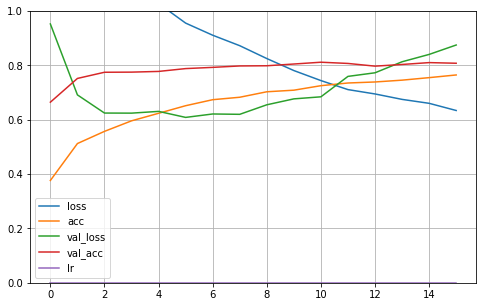

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # setting limits for y-axis
plt.show()

In [ ]:
tf.keras.backend.clear_session() # clearing session
np.random.seed(42) # generating random see
tf.random.set_seed(42) # set.seed function helps reuse same set of random variables